In [57]:
import fitz  # PyMuPDF  
from PIL import Image  
from io import BytesIO  
import base64
import matplotlib.pyplot as plt

In [ ]:
def get_image_coordinates(page, image_name):
    
    img_rect = page.get_image_bbox(image_name)  
    
    img_coordinates = {  
        "x0": img_rect.x0,  
        "y0": img_rect.y0,  
        "x1": img_rect.x1,  
        "y1": img_rect.y1  
    }

    return img_coordinates


def get_image_caption(page, img_coordinates):

    captions = ""

    for block in page.get_text("blocks"):
        if (block[3] - 50) < img_coordinates["y1"] < block[3]:
            captions += block[4]

    return captions


def save_image(image_bytes, page_index, image_index, image_ext):
    # save the image
    image_name = f"./ExtractedImages/image{page_index+1}_{image_index}.{image_ext}"
    with open(image_name, "wb") as image_file:
        image_file.write(image_bytes)
        print(f"[+] Image saved as {image_name}")


def show_image_from_bytes(image_bytes):  
    # Crear una imagen desde los bytes  
    image = Image.open(BytesIO(image_bytes))  
  
    # Mostrar la imagen usando matplotlib  
    plt.imshow(image)  
    plt.axis('off')  # Ocultar los ejes  
    plt.show() 
    

def extract_images_from_pdf(file, save_images=True):  

    images_data = [] 
    
    pdf_file = fitz.open(file)

    # STEP 3
    # iterate over PDF pages
    for page_index in range(len(pdf_file)):

        # get the page itself
        page = pdf_file.load_page(page_index)  # load the page
        image_list = page.get_images(full=True)  # get images on the page

        # printing number of images found in this page
        if image_list:
            print(f"[+] Found a total of {len(image_list)} images on page {page_index}")
        else:
            print(f"[!] No images found on page {page_index}")
            continue
        
        for image_index, img in enumerate(image_list, start=1):
            # get the XREF of the image
            xref = img[0]
            base_image = pdf_file.extract_image(xref)

            image_bytes = base_image["image"]
            image_ext = base_image["ext"]

            image_coordinates = get_image_coordinates(page, img[7])
            print(image_coordinates)
            images_data.append({  
                "page": page_index + 1,  
                "coordinates": image_coordinates,
                "caption": get_image_caption(page, image_coordinates),
                "base64": image_bytes
            })  

            if save_images:
                save_image(image_bytes, page_index, image_index, image_ext)


    return images_data

In [65]:
pdf_path = "../../data/r44_mm_4.pdf"  
images_info = extract_images_from_pdf(pdf_path)  
images_info


[!] No images found on page 0
[!] No images found on page 1
[!] No images found on page 2
[!] No images found on page 3
[!] No images found on page 4
[!] No images found on page 5
[!] No images found on page 6
[!] No images found on page 7
[+] Found a total of 1 images on page 8
{'x0': 0.0, 'y0': 0.0, 'x1': 611.1599731445312, 'y1': 791.1599731445312}
[+] Image saved as ./ExtractedImages/image9_1.png
[+] Found a total of 1 images on page 9
{'x0': 0.0, 'y0': 0.0, 'x1': 611.0399780273438, 'y1': 791.280029296875}
[+] Image saved as ./ExtractedImages/image10_1.png
[+] Found a total of 1 images on page 10
{'x0': 0.0, 'y0': 0.0, 'x1': 611.1599731445312, 'y1': 791.1599731445312}
[+] Image saved as ./ExtractedImages/image11_1.png
[+] Found a total of 1 images on page 11
{'x0': -0.7200009822845459, 'y0': -0.4801025390625, 'x1': 612.0, 'y1': 791.760009765625}
[+] Image saved as ./ExtractedImages/image12_1.png
[+] Found a total of 1 images on page 12
{'x0': 0.0, 'y0': 0.0, 'x1': 611.1599731445312,

[{'page': 9,
  'coordinates': {'x0': 0.0,
   'y0': 0.0,
   'x1': 611.1599731445312,
   'y1': 791.1599731445312},
  'caption': '',
  'base64': b'\x00\x00\x00\x000\x00\x01\x00\x00\x00\x13\x00\x00\x13\xe5\x00\x00\x19\xc1\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x01&\x00\x01\x00\x00\xa3@\x00\x00\x13\xe5\x00\x00\x19\xc1\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x03\xff\xfd\xff\x02\xfe\xfe\xfe\xac\x01\xff\x7f\xff\x7f\xff\x7f\xf6\xcbYh\xa8\xa1\x07i+g\xedi6\x1a\x9fD\xed\xb6\x1f&\xd5\xf5\x7f\x07M\xf5\xd2\xd4\x96\x9cP\n\x16X+\x8fG!9/\x9f\xcb\xac?\xb0B\xc6\x8bl\x03e\xb4\xa6 OX\xc2\x1aU\xe4\xd0\xfeB\x8b\x18\xd5\xffO\xf9E\xffj~V);\xbf\xe7\x8e\\\x98Y\x91\x08$\xd7\x88$z\xf0\x07D8\xcbS\xe0\xb6\xab\xf9\xc8\x08Y/\x8a\xf6\xeb@XR\t\xe6,\x86D\xd7\x87\x84\x02\xc6\xcaZNgh\xd1E\x01}\xf8\n_AS\x92jj4\xb8\xb4T\x93E\xf7B\x80\x06Gx\xeb\x11\x80\xb9ut\x86\xb9 \xb2\x15\xf1S\x8au$\xfdW(Xu\xb2\xc8$\x11Yk\x86yB\xaf\x14\xc2[>\x08G\x83\xf28r\xacq\xb6\xa6\xc3|L\x84i\xf0\xb3Fe\x16t\x01\x98\x17\x0cEN\x84\xbdjiw)\xc

In [25]:
pdf_file = fitz.open("../../data/r44_mm_4.pdf" )

In [31]:
page = pdf_file.load_page(17)
image_list = page.get_images(full=True)

In [ ]:
xref = image_list[0][0]

In [29]:
print([b for b in page.get_text("blocks")]) # if b[-1] == 1])  # take only image blocks


[(222.2353973388672, 717.2314453125, 389.74603271484375, 729.39453125, 'FIGURE 4-3  TAILCONE ASSEMBLY\n', 0, 0), (54.0, 753.041015625, 557.9806518554688, 767.63671875, 'Page 4.16\t\nDEC 2011\n', 1, 0), (53.34000015258789, 31.340007781982422, 562.9680786132812, 50.61800765991211, 'ROBINSON \nMAINTENANCE MANUAL \nMODEL R44 \n', 2, 0), (349.7200012207031, 88.74247741699219, 524.9160766601562, 114.619873046875, 'Forward antenna cable connection \ninside tailcone forward bay. \n', 3, 0), (137.22608947753906, 125.93247985839844, 291.1783752441406, 151.56988525390625, 'Aft antenna cable connects at \ntailcone forward bulkhead. \n', 4, 0), (36.189998626708984, 277.62249755859375, 175.30599975585938, 343.08599853515625, 'When installing tailcone, \ninstall MS3367-4-9 or \n-5-9 ty-raps as required \nto secure wire harness J \nand cables to frame. \nIi \n', 5, 0), (33.630001068115234, 528.5700073242188, 131.1400146484375, 554.1099853515625, 'A331-4 \nBellcrank assembly \n', 6, 0), (372.8599853515

In [30]:
print([b for b in page.get_text("blocks") if b[-1] == 1])

[]


In [39]:
img_rect = page.get_image_bbox(image_list[0][7])  
img_coordinates = {  
    "x0": img_rect.x0,  
    "y0": img_rect.y0,  
    "x1": img_rect.x1,  
    "y1": img_rect.y1  
}


In [40]:
img_coordinates


{'x0': 30.752182006835938,
 'y0': 61.1678466796875,
 'x1': 581.14599609375,
 'y1': 709.90625}

In [43]:
#[(222.2353973388672, 717.2314453125, 389.74603271484375, 729.39453125, 'FIGURE 4-3  TAILCONE ASSEMBLY\n', 0, 0),
for block in page.get_text("blocks"):
    if (block[3] - 50) < img_coordinates["y1"] < block[3]:
        print(block)

(222.2353973388672, 717.2314453125, 389.74603271484375, 729.39453125, 'FIGURE 4-3  TAILCONE ASSEMBLY\n', 0, 0)


In [ ]:
base_image = pdf_file.extract_image(xref)
base_image['image']

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x08\xf6\x00\x00\n\x90\x08\x00\x00\x00\x00\x00gwX\x00\x00\x00\tpHYs\x00\x00\x0e\xc4\x00\x00\x0e\xc4\x01\x95+\x0e\x1b\x00\x02x\x9eIDATx\x9c\xec\x9d\x8b\x9a\xac*\x0eF}\xff\x97v\xe6\xec.\x95K\x12\x02\x82\xa2\xae\xf5\xcdt\x97\x02I@$\x7f\xa1\xbd\xcf\xb2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x9d\xac1g\x8d\xf5\t\n\x00\x00\x00\xa0/\xab\xcc)s=\xe3\x03\x00\x00\x00\xe8\x81\xa2y\xda\x95O\x8f\xed"\x00\x00\x00\x80\xce\x98\x9a\xa7M\xbe\xa0z\x00\x00\x00`>t\x91\xd3,|\xba\xbc\x1a\x04\x00\x00\x00\xd0\x95T\xd9\xa4r\xa5E\xf8\xa0z\x00\x00\x00`>2U\x93\xeb\x95j\xdds\xe6\x95 \x00\x00\x00\x80!(\xcf\xb5\xb4jU6;\x86\t\x00\x00\x00p\x0e\xe9\xf9\x95\xa2X\xdcR\x06\xd1\x03\x00\x00\x00\xf3!*\x14U\xb3\xb8\xe4L\xdb\x0b\xd0\x00\x00\x00\x00c\x11\x05\x8a.Z\xca\x8a\x06\xd1\x03\x00\x00\x00s\xa2\xbf\

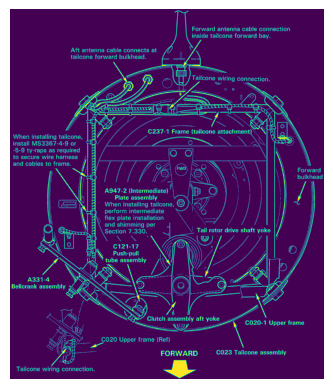

In [49]:
show_image_from_bytes(base_image['image'])